In [129]:
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
image = cv2.imread("mini.jpg") #Replace with your image path
cv2.imshow("Minion",image)
cv2.waitKey(0)
cv2.destroyAllWindows()

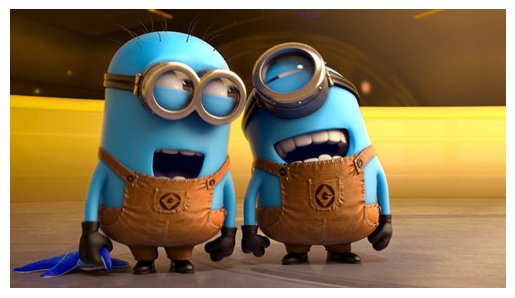

In [131]:
plt.imshow(image)
plt.axis('off')
plt.show()

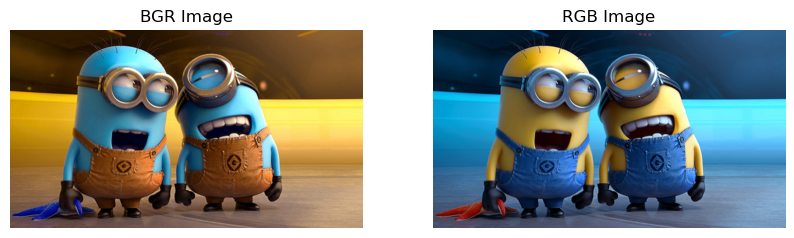

In [132]:
rgb_img = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))

plt.subplot(1,2,1)
plt.imshow(image)
plt.axis('off')
plt.title('BGR Image')

plt.subplot(1,2,2)
plt.imshow(rgb_img)
plt.axis('off')
plt.title('RGB Image')

plt.show()

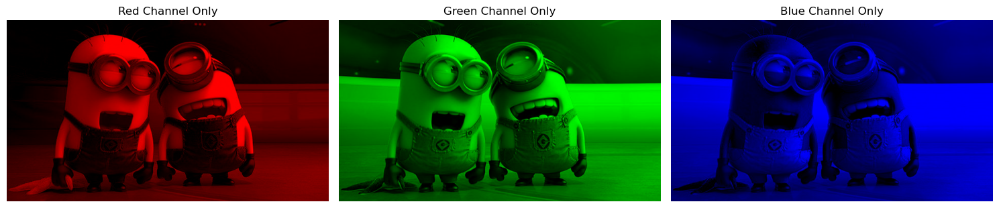

In [133]:
red_img = rgb_img.copy()
green_img = rgb_img.copy()
blue_img = rgb_img.copy()

red_img[:, :, 1] = 0
red_img[:, :, 2] = 0

green_img[:, :, 0] = 0
green_img[:, :, 2] = 0

blue_img[:, :, 0] = 0
blue_img[:, :, 1] = 0

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(red_img)
plt.axis('off')
plt.title('Red Channel Only')

plt.subplot(1, 3, 2)
plt.imshow(green_img)
plt.axis('off')
plt.title('Green Channel Only')

plt.subplot(1, 3, 3)
plt.imshow(blue_img)
plt.axis('off')
plt.title('Blue Channel Only')

plt.tight_layout()
plt.show()

In [134]:
R = rgb_img[:, :, 0].astype(float) / 255
G = rgb_img[:, :, 1].astype(float) / 255
B = rgb_img[:, :, 2].astype(float) / 255

C = 1 - R
M = 1 - G
Y = 1 - B

cmy_img = cv2.merge((C, M, Y)) 

C_display = (C * 255).astype(np.uint8)
M_display = (M * 255).astype(np.uint8)
Y_display = (Y * 255).astype(np.uint8)

cyan_img = np.zeros_like(rgb_img)
cyan_img[:, :, 1] = C_display
cyan_img[:, :, 2] = C_display

magenta_img = np.zeros_like(rgb_img)
magenta_img[:, :, 0] = M_display
magenta_img[:, :, 2] = M_display

yellow_img = np.zeros_like(rgb_img)
yellow_img[:, :, 0] = Y_display
yellow_img[:, :, 1] = Y_display

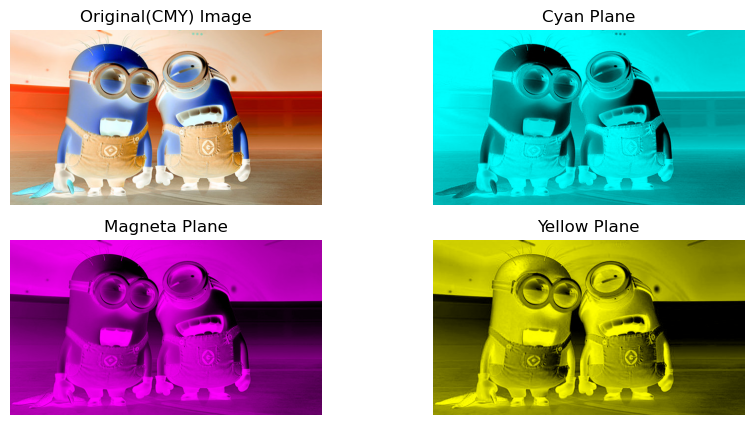

In [135]:
plt.figure(figsize=(10,5))

plt.subplot(2,2,1)
plt.imshow(cmy_img)
plt.axis('off')
plt.title('Original(CMY) Image')

plt.subplot(2,2,2)
plt.imshow(cyan_img)
plt.axis('off')
plt.title('Cyan Plane')

plt.subplot(2,2,3)
plt.imshow(magenta_img)
plt.axis('off')
plt.title('Magneta Plane')

plt.subplot(2,2,4)
plt.imshow(yellow_img)
plt.axis('off')
plt.title('Yellow Plane')

plt.show()

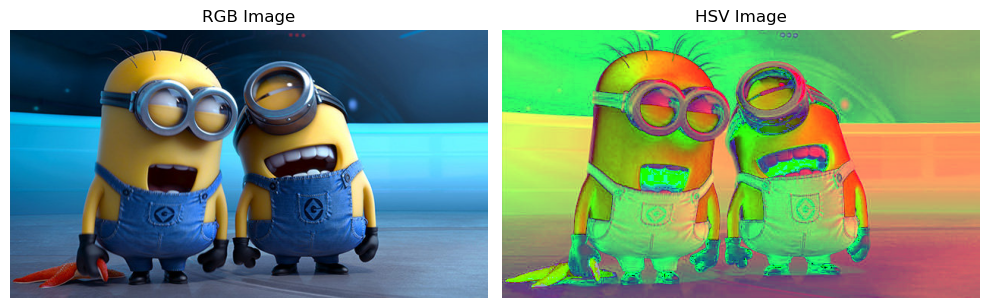

In [136]:
hsv = cv2.cvtColor(rgb_img,cv2.COLOR_RGB2HSV)
hsv_rgb = cv2.cvtColor(hsv,cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))

plt.subplot(1,2,1)
plt.imshow(rgb_img)
plt.axis('off')
plt.title('RGB Image')

plt.subplot(1,2,2)
plt.imshow(hsv_rgb)
plt.axis('off')
plt.title('HSV Image')

plt.tight_layout()
plt.show()

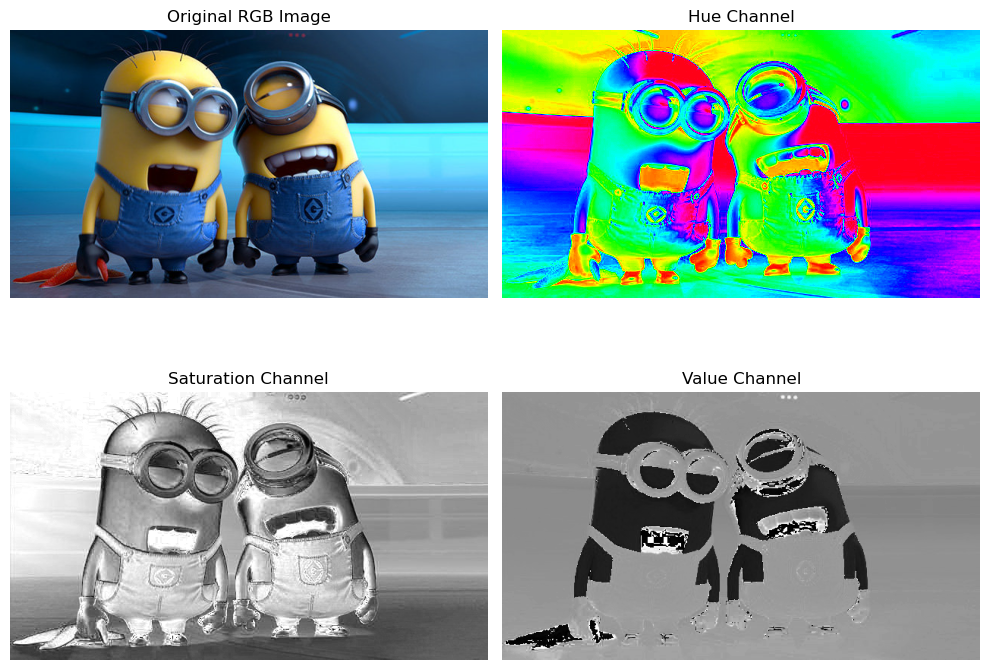

In [137]:
H, S, V = cv2.split(hsv_rgb)

plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.imshow(rgb_img)
plt.axis('off')
plt.title('Original RGB Image')

plt.subplot(2, 2, 2)
plt.imshow(H, cmap='hsv')
plt.axis('off')
plt.title('Hue Channel')

plt.subplot(2, 2, 3)
plt.imshow(S, cmap='gray')
plt.axis('off')
plt.title('Saturation Channel')

plt.subplot(2, 2, 4)
plt.imshow(V, cmap='gray')
plt.axis('off')
plt.title('Value Channel')

plt.tight_layout()
plt.show()

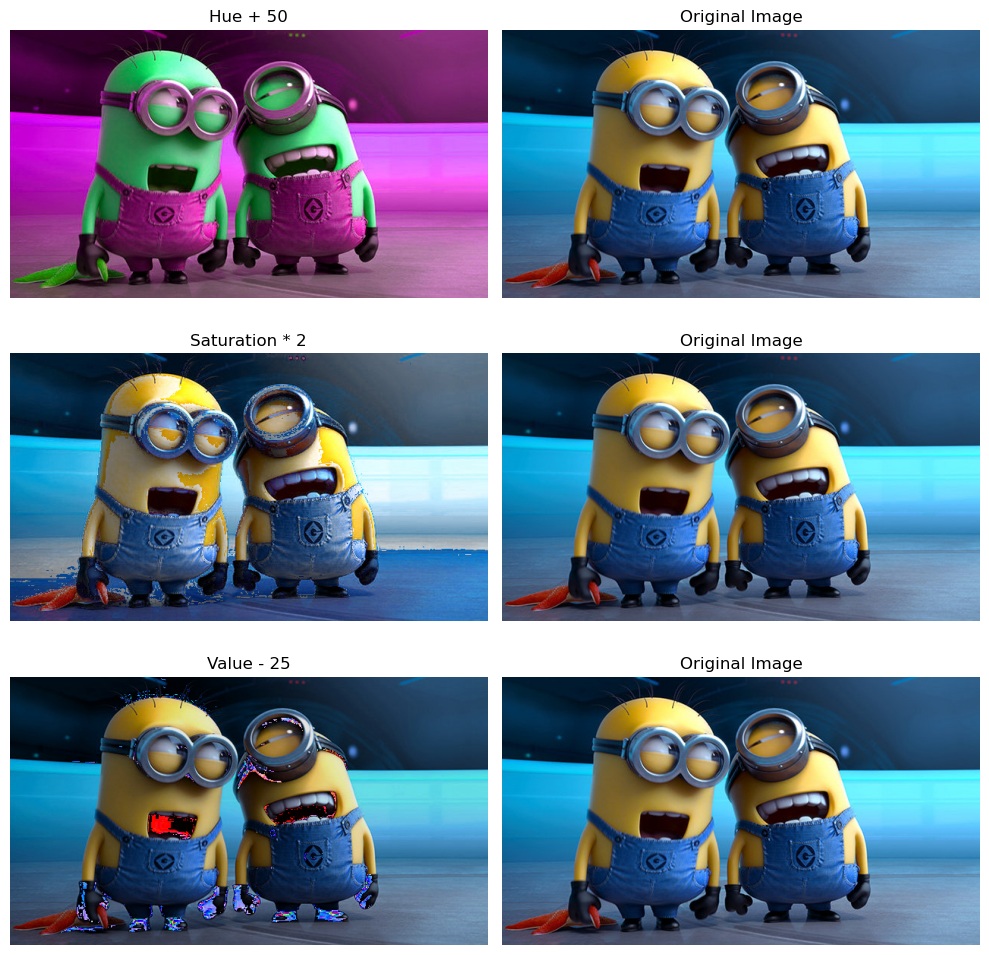

In [ ]:
image = cv2.imread("mini.jpg") #Replace with your image path
rgb_img = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
hsv_img = cv2.cvtColor(rgb_img,cv2.COLOR_RGB2HSV)

H, S, V = cv2.split(hsv_img)

plt.figure(figsize = (10,10))

hue_new = H + 50
hue_new = hue_new % 180
hsv_hue = cv2.merge((hue_new, S, V))
hsv_hue1 = cv2.cvtColor(hsv_hue,cv2.COLOR_HSV2RGB)

sat_new = S * 2
sat_new = np.clip(sat_new, 0, 255)
hsv_sat = cv2.merge((H, sat_new, V))
hsv_sat1 = cv2.cvtColor(hsv_sat,cv2.COLOR_HSV2RGB)

val_new = V - 25
val_new = np.clip(val_new, 0, 255)
hsv_val = cv2.merge((H, S, val_new))
hsv_val1 = cv2.cvtColor(hsv_val,cv2.COLOR_HSV2RGB)

plt.subplot(3,2,1)
plt.imshow(hsv_hue1)
plt.axis('off')
plt.title('Hue + 50')

plt.subplot(3,2,2)
plt.imshow(rgb_img)
plt.axis('off')
plt.title('Original Image')

plt.subplot(3,2,3)
plt.imshow(hsv_sat1)
plt.axis('off')
plt.title('Saturation * 2')

plt.subplot(3,2,4)
plt.imshow(rgb_img)
plt.axis('off')
plt.title('Original Image')

plt.subplot(3,2,5)
plt.imshow(hsv_val1)
plt.axis('off')
plt.title('Value - 25')

plt.subplot(3,2,6)
plt.imshow(rgb_img)
plt.axis('off')
plt.title('Original Image')

plt.tight_layout()
plt.show()

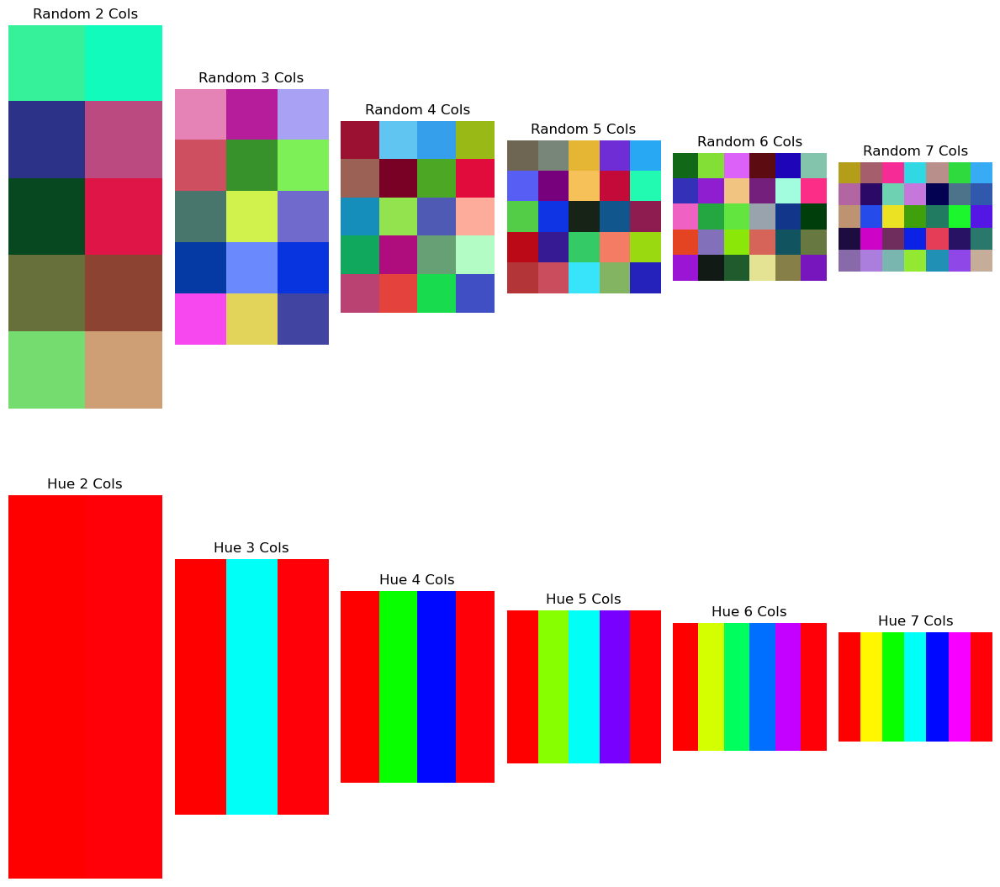

In [143]:
plt.figure(figsize=(12, 12))

for i in range(1, 7):
    random_patch = np.random.rand(5, i + 1, 3)
    random_patch_img = (random_patch * 255).astype(np.uint8)
    
    hue_patch = np.zeros((5, i + 1, 3), dtype=np.uint8) 
    hue_values = np.linspace(0, 179, i + 1, dtype=np.uint8) 
    for col in range(i + 1):
        hue_patch[:, col] = [hue_values[col], 255, 255] 
    
    hue_patch_img = cv2.cvtColor(hue_patch, cv2.COLOR_HSV2RGB)

    plt.subplot(2, 6, i)  # Top row for random patches
    plt.imshow(random_patch_img)
    plt.axis('off')
    plt.title(f'Random {i + 1} Cols')

    plt.subplot(2, 6, i + 6)
    plt.imshow(hue_patch_img)
    plt.axis('off')
    plt.title(f'Hue {i + 1} Cols')

plt.tight_layout()
plt.show()

In [ ]:
image = cv2.imread("red.jpg") #Replace with your image path
cv2.imshow("Minion",image)
cv2.waitKey(0)
cv2.destroyAllWindows()

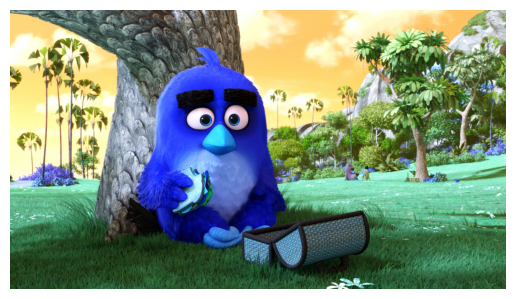

In [145]:
plt.imshow(image)
plt.axis('off')
plt.show()

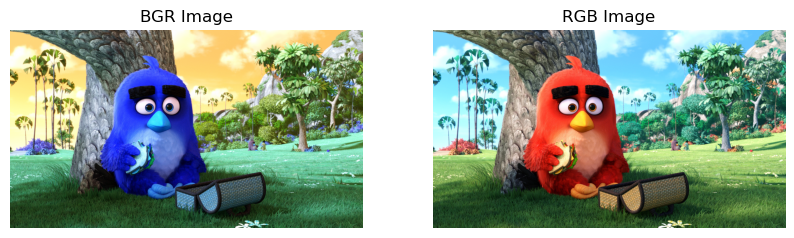

In [146]:
rgb_img = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))

plt.subplot(1,2,1)
plt.imshow(image)
plt.axis('off')
plt.title('BGR Image')

plt.subplot(1,2,2)
plt.imshow(rgb_img)
plt.axis('off')
plt.title('RGB Image')

plt.show()

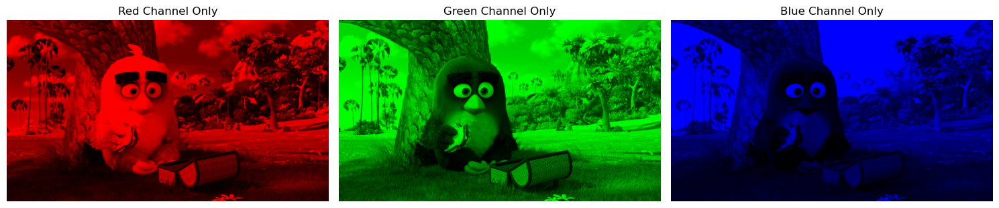

In [147]:
red_img = rgb_img.copy()
green_img = rgb_img.copy()
blue_img = rgb_img.copy()

red_img[:, :, 1] = 0
red_img[:, :, 2] = 0

green_img[:, :, 0] = 0
green_img[:, :, 2] = 0

blue_img[:, :, 0] = 0
blue_img[:, :, 1] = 0

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(red_img)
plt.axis('off')
plt.title('Red Channel Only')

plt.subplot(1, 3, 2)
plt.imshow(green_img)
plt.axis('off')
plt.title('Green Channel Only')

plt.subplot(1, 3, 3)
plt.imshow(blue_img)
plt.axis('off')
plt.title('Blue Channel Only')

plt.tight_layout()
plt.show()

In [148]:
R = rgb_img[:, :, 0].astype(float) / 255
G = rgb_img[:, :, 1].astype(float) / 255
B = rgb_img[:, :, 2].astype(float) / 255

C = 1 - R
M = 1 - G
Y = 1 - B

cmy_img = cv2.merge((C, M, Y)) 

C_display = (C * 255).astype(np.uint8)
M_display = (M * 255).astype(np.uint8)
Y_display = (Y * 255).astype(np.uint8)

cyan_img = np.zeros_like(rgb_img)
cyan_img[:, :, 1] = C_display
cyan_img[:, :, 2] = C_display

magenta_img = np.zeros_like(rgb_img)
magenta_img[:, :, 0] = M_display
magenta_img[:, :, 2] = M_display

yellow_img = np.zeros_like(rgb_img)
yellow_img[:, :, 0] = Y_display
yellow_img[:, :, 1] = Y_display

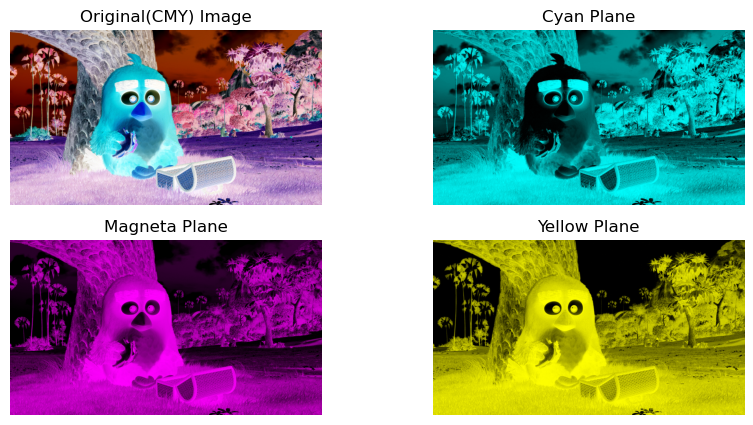

In [149]:
plt.figure(figsize=(10,5))

plt.subplot(2,2,1)
plt.imshow(cmy_img)
plt.axis('off')
plt.title('Original(CMY) Image')

plt.subplot(2,2,2)
plt.imshow(cyan_img)
plt.axis('off')
plt.title('Cyan Plane')

plt.subplot(2,2,3)
plt.imshow(magenta_img)
plt.axis('off')
plt.title('Magneta Plane')

plt.subplot(2,2,4)
plt.imshow(yellow_img)
plt.axis('off')
plt.title('Yellow Plane')

plt.show()

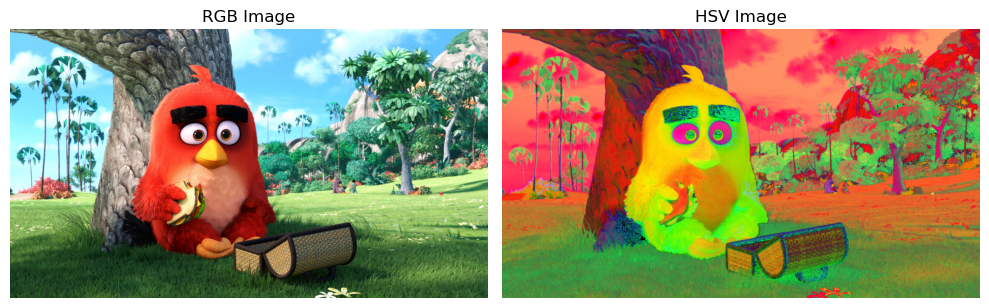

In [150]:
hsv = cv2.cvtColor(rgb_img,cv2.COLOR_RGB2HSV)
hsv_rgb = cv2.cvtColor(hsv,cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))

plt.subplot(1,2,1)
plt.imshow(rgb_img)
plt.axis('off')
plt.title('RGB Image')

plt.subplot(1,2,2)
plt.imshow(hsv_rgb)
plt.axis('off')
plt.title('HSV Image')

plt.tight_layout()
plt.show()

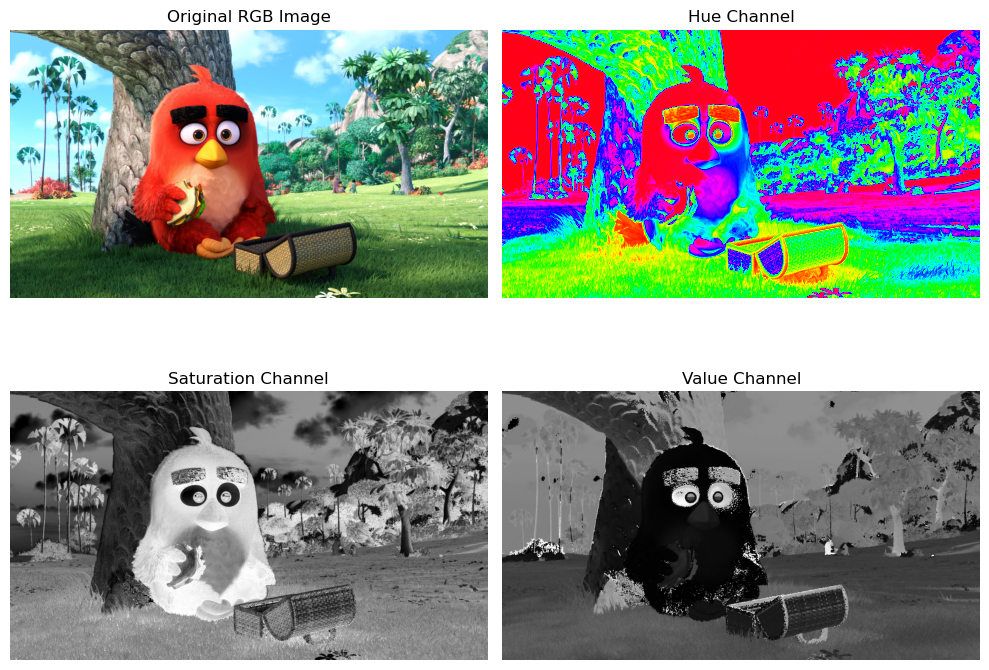

In [151]:
H, S, V = cv2.split(hsv_rgb)

plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.imshow(rgb_img)
plt.axis('off')
plt.title('Original RGB Image')

plt.subplot(2, 2, 2)
plt.imshow(H, cmap='hsv')
plt.axis('off')
plt.title('Hue Channel')

plt.subplot(2, 2, 3)
plt.imshow(S, cmap='gray')
plt.axis('off')
plt.title('Saturation Channel')

plt.subplot(2, 2, 4)
plt.imshow(V, cmap='gray')
plt.axis('off')
plt.title('Value Channel')

plt.tight_layout()
plt.show()

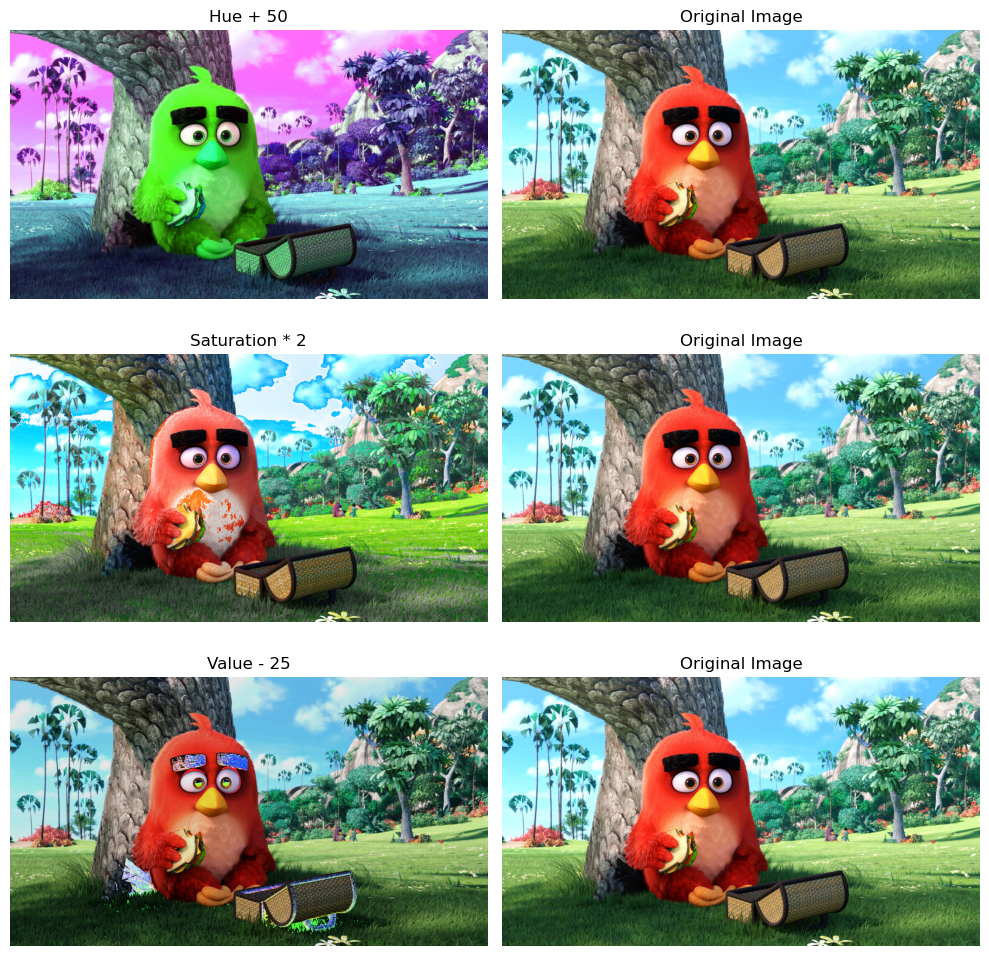

In [ ]:
image = cv2.imread("red.jpg") #Replace with your image path
rgb_img = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
hsv_img = cv2.cvtColor(rgb_img,cv2.COLOR_RGB2HSV)

H, S, V = cv2.split(hsv_img)

plt.figure(figsize = (10,10))

hue_new = H + 50
hue_new = hue_new % 180
hsv_hue = cv2.merge((hue_new, S, V))
hsv_hue1 = cv2.cvtColor(hsv_hue,cv2.COLOR_HSV2RGB)

sat_new = S * 2
sat_new = np.clip(sat_new, 0, 255)
hsv_sat = cv2.merge((H, sat_new, V))
hsv_sat1 = cv2.cvtColor(hsv_sat,cv2.COLOR_HSV2RGB)

val_new = V - 25
val_new = np.clip(val_new, 0, 255)
hsv_val = cv2.merge((H, S, val_new))
hsv_val1 = cv2.cvtColor(hsv_val,cv2.COLOR_HSV2RGB)

plt.subplot(3,2,1)
plt.imshow(hsv_hue1)
plt.axis('off')
plt.title('Hue + 50')

plt.subplot(3,2,2)
plt.imshow(rgb_img)
plt.axis('off')
plt.title('Original Image')

plt.subplot(3,2,3)
plt.imshow(hsv_sat1)
plt.axis('off')
plt.title('Saturation * 2')

plt.subplot(3,2,4)
plt.imshow(rgb_img)
plt.axis('off')
plt.title('Original Image')

plt.subplot(3,2,5)
plt.imshow(hsv_val1)
plt.axis('off')
plt.title('Value - 25')

plt.subplot(3,2,6)
plt.imshow(rgb_img)
plt.axis('off')
plt.title('Original Image')

plt.tight_layout()
plt.show()